In [57]:
%matplotlib inline

In [58]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [59]:
from Generator import StreamGenerator, ClusterPoints

In [60]:
np.random.seed(0)

# Generate parent dataset
## Create the generator

In [61]:
sg = StreamGenerator(weights = np.ones(10) * 1./10,
                     number_points = 1000,
                     dimensionality = 10,
                     min_projected_dim = 8,
                     max_projected_dim = 10,
                     min_coordinate = -10,
                     max_coordinate = 10,
                     min_projected_dim_var = 0.1,
                     max_projected_dim_var = 0.5,
                     )

[-0.97627008 -4.30378733 -2.05526752 -0.89766366  1.52690401 -2.91788226
  1.24825577 -7.83546002 -9.27325521  2.33116962]
[-2.79842043  7.13293425 -8.89337834 -0.43696644  1.7067612   4.70888776
 -5.48467379  0.87699336 -1.36867898  9.62420399]
[-2.68548116 -9.17898537 -3.05580634 -2.70117747 -9.90599135 -1.63700659
  1.71262824  0.50604995 -2.47020202  3.2398477 ]
[ 4.07719605  7.62544562  3.64033641  1.71474011  8.71705007 -3.84944239
 -1.33202908  4.69221018 -0.46496107  8.12118978]
[-5.12213388  2.07803449 -7.92076775 -2.77842152 -7.83108874 -3.60111139
  1.01604524 -9.57141857  7.67596181 -5.34047407]
[-7.56904381  7.94273283  8.15252221  2.91906676 -1.03632518  9.32749813
 -9.37923531  3.58005517  5.5747463   7.1747219 ]
[ 1.85633406  8.61666009 -3.94857546  0.92914635 -4.44111199 -7.32764652
 -9.5104301  -7.11606685  9.76571832  2.80043871]
[-9.84792798  4.65474924 -3.58181231 -7.28562885 -5.01688491 -9.28979536
 -1.0848487   5.75219002  5.55113551  5.62501253]
[ 0.61005634  0.

## Create the dataset

In [6]:
stream_ss,stream_df = sg.get_full_dataset(1001)

## Plot the dataset

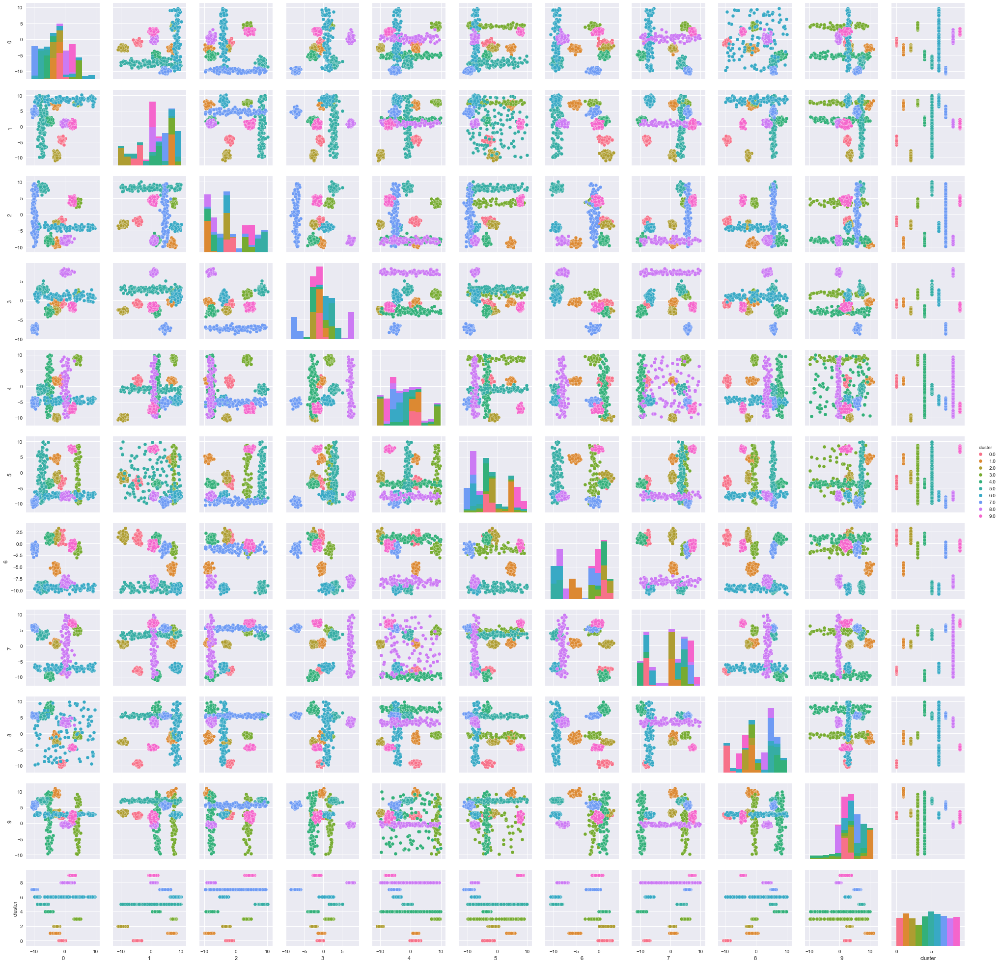

In [7]:
sns.pairplot(data=stream_df,hue="cluster")

# Train a model to separate the dataset

In [8]:
from sklearn import tree
clf = tree.DecisionTreeClassifier()

In [9]:
features = range(10)
clf = clf.fit(stream_df[features], stream_df["cluster"])

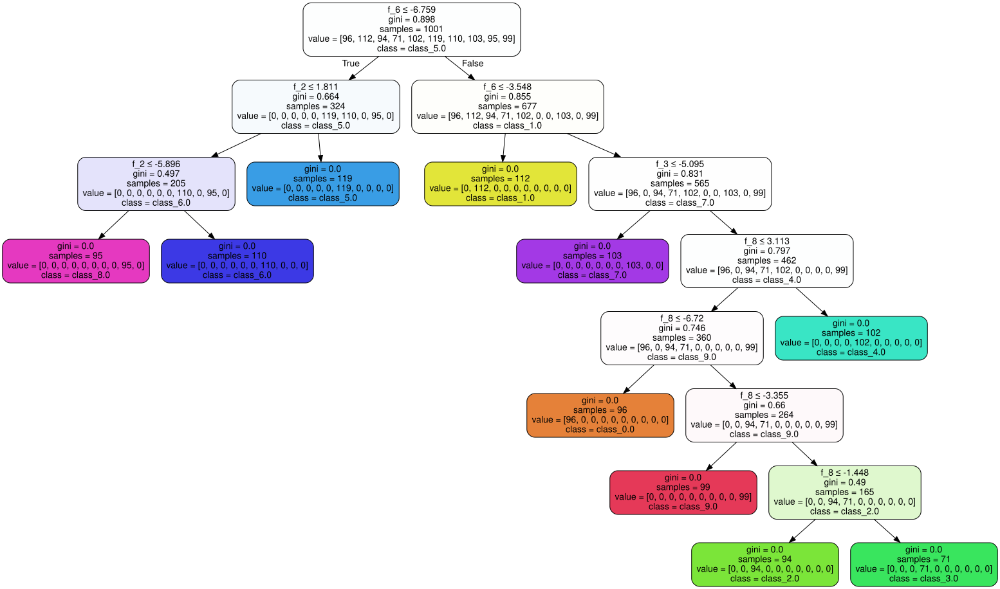

In [10]:
import graphviz 
dot_data = tree.export_graphviz(clf, out_file=None, 
                         feature_names=["f_"+`f` for f in features],  
                         class_names=["class_"+`c` for c in np.unique(stream_df.cluster)],  
                         filled=True, rounded=True,  
                         special_characters=True)  

graph = graphviz.Source(dot_data)  
graph.render('prarent_tree.gv', view=True)
graph

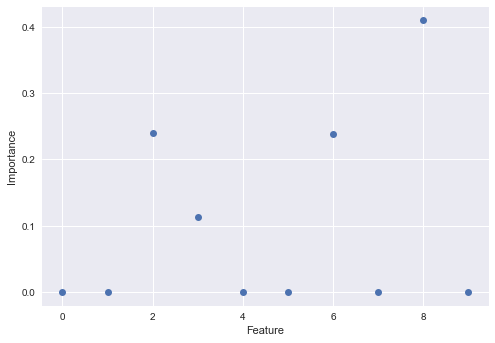

In [12]:
plt.plot(clf.feature_importances_,"o")
plt.xlabel("Feature")
plt.ylabel("Importance")

# Change cluster size

In [18]:
from Changes import change_cluster_weight

In [19]:
change_cluster_weight(sg.clusters,clusters_weights={0:0.01,9:0.99})

In [20]:
[c.weight for c in sg.clusters]

[0.01,
 0.10000000000000001,
 0.10000000000000001,
 0.10000000000000001,
 0.10000000000000001,
 0.10000000000000001,
 0.10000000000000001,
 0.10000000000000001,
 0.10000000000000001,
 0.99]

In [21]:
stream_ss,stream_df = sg.get_full_dataset(1001)

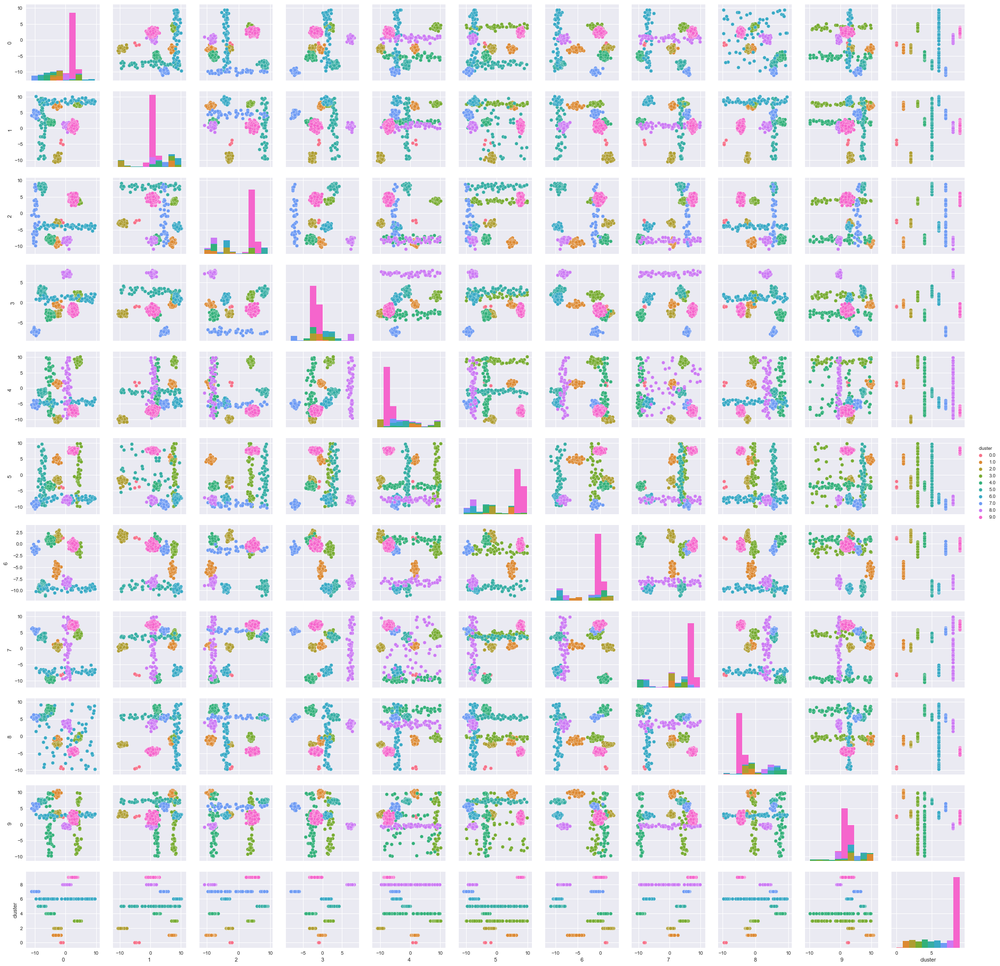

In [22]:
sns.pairplot(data=stream_df,hue="cluster")

# Remove Dimension

In [23]:
from Changes import loose_feature

In [24]:
loose_feature(sg.clusters, {i:[6,8] for i in range(10)})

In [25]:
stream_ss,stream_df = sg.get_full_dataset(1001)

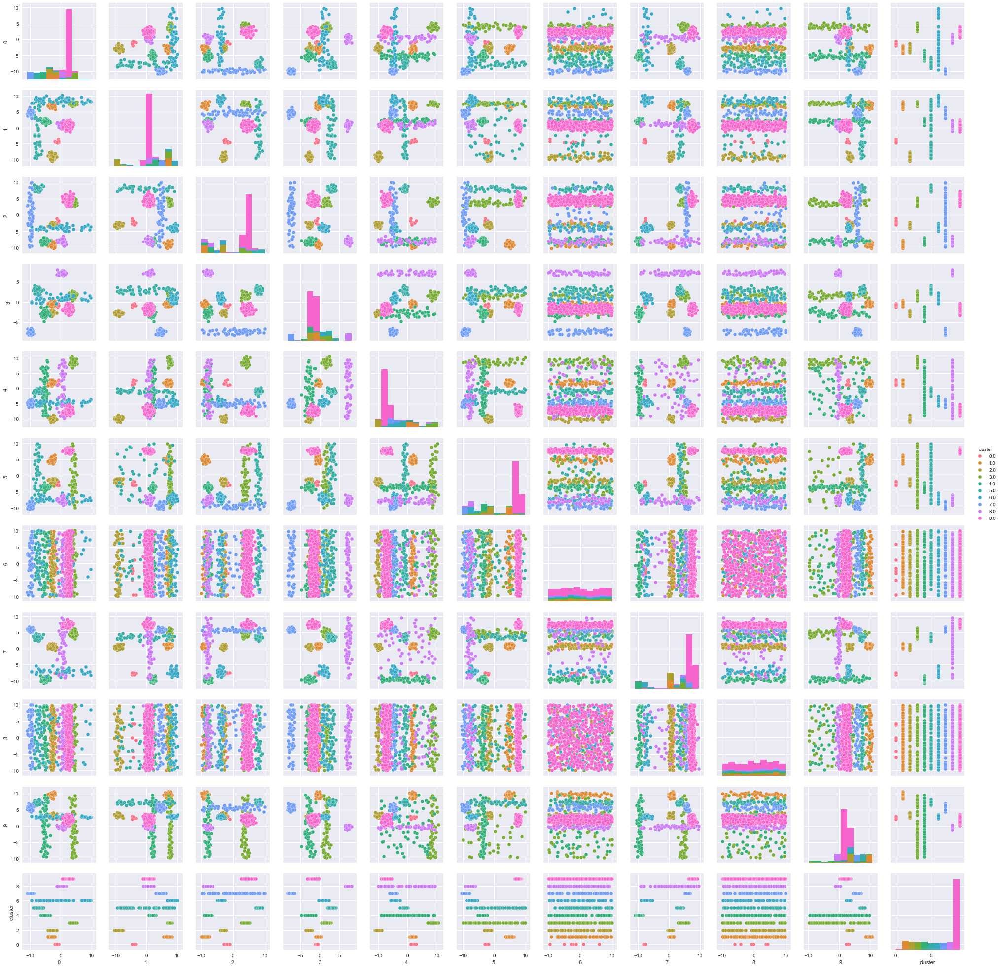

In [26]:
sns.pairplot(data=stream_df,hue="cluster")

# Include Dimension

In [28]:
from Changes import gain_feature

In [29]:
gain_feature(sg.clusters, {i:[6,8] for i in range(10)})

In [30]:
stream_ss,stream_df = sg.get_full_dataset(1001)

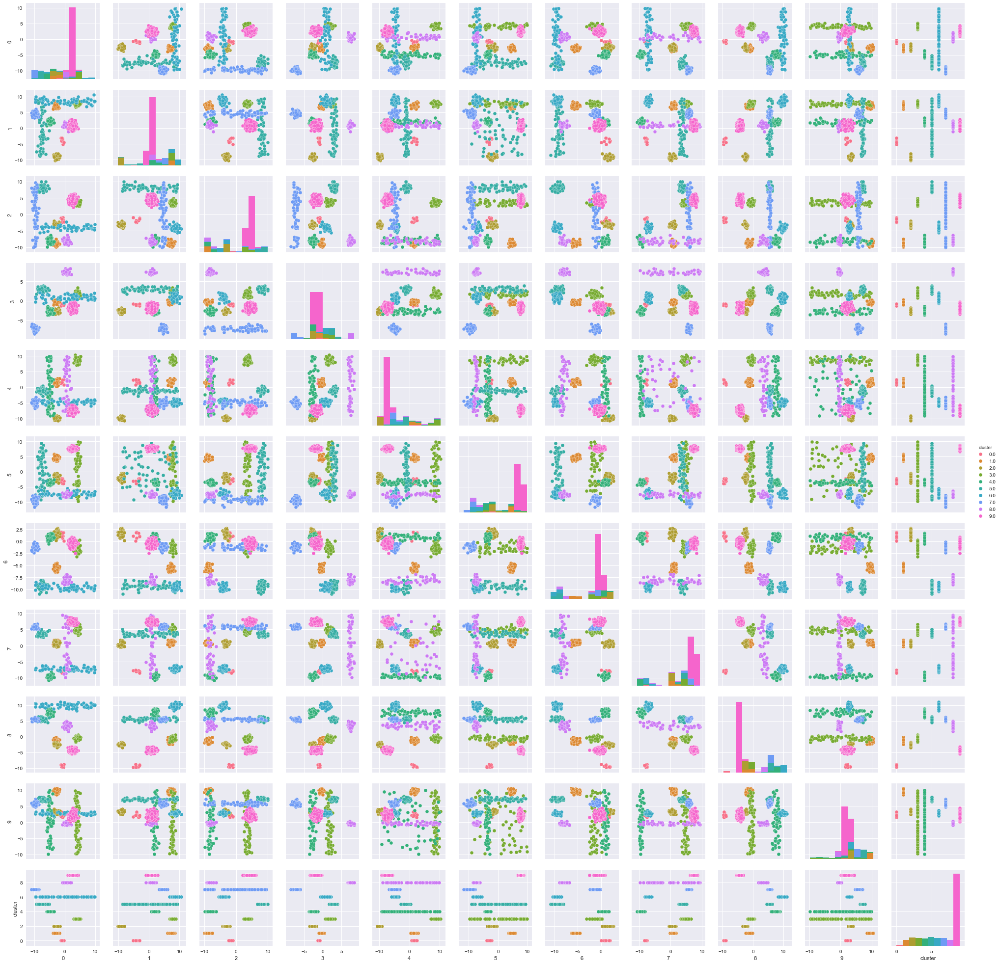

In [31]:
sns.pairplot(data=stream_df,hue="cluster")

# Delete Cluster

In [32]:
from Changes import delete_clusters

In [33]:
delete_clusters(sg.clusters, [0])

In [34]:
stream_ss,stream_df = sg.get_full_dataset(1001)

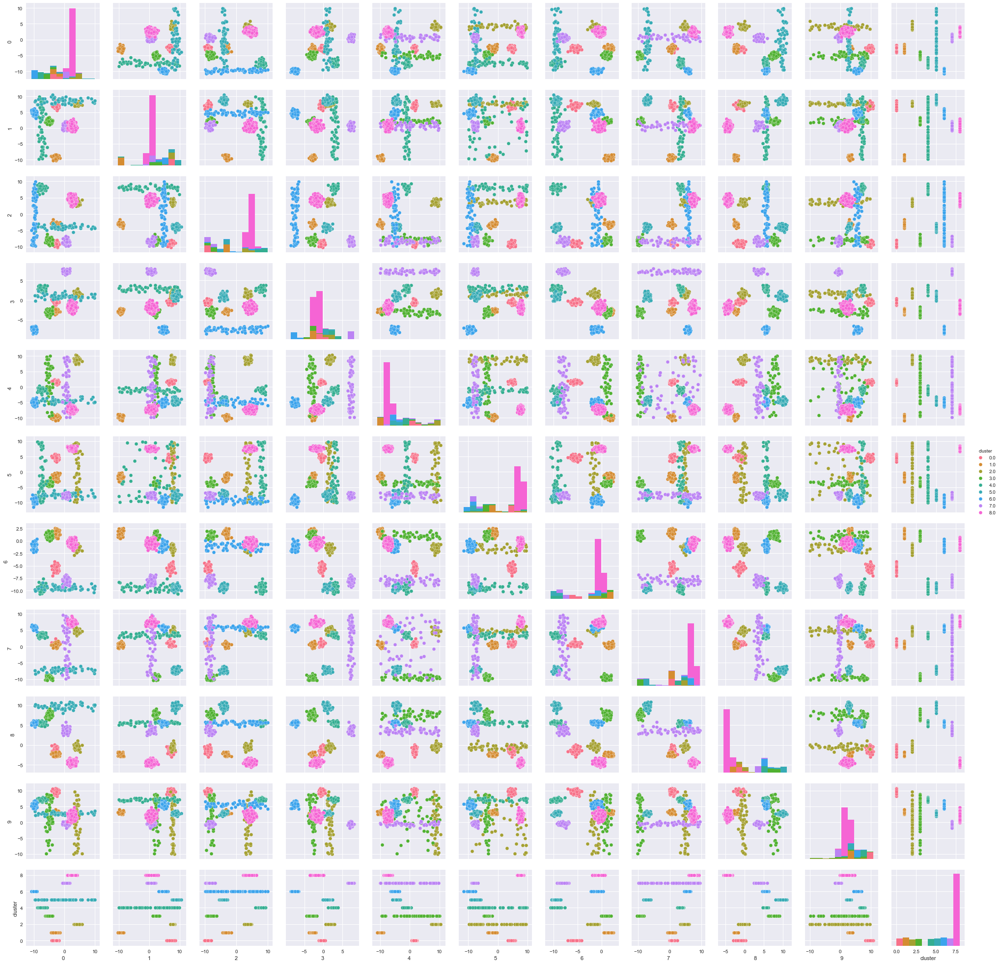

In [35]:
sns.pairplot(data=stream_df,hue="cluster")

# Add Cluster

In [43]:
from Changes import create_new_clusters

In [45]:
parameters = {
"weight":0.9,
"dimensionality":10,
"min_projected_dim":8,
"max_projected_dim":10,
"min_coordinate":0,
"max_coordinate":10,
"min_projected_dim_var":0.1,
"max_projected_dim_var":0.5,
}

In [46]:
create_new_clusters(sg.clusters,[parameters])

[ 2.57089977  4.692637    6.49619585  6.16642204  3.93281296  5.72229695
  3.52777843  6.90166832  7.99034973  4.50489637]


In [47]:
stream_ss,stream_df = sg.get_full_dataset(1001)

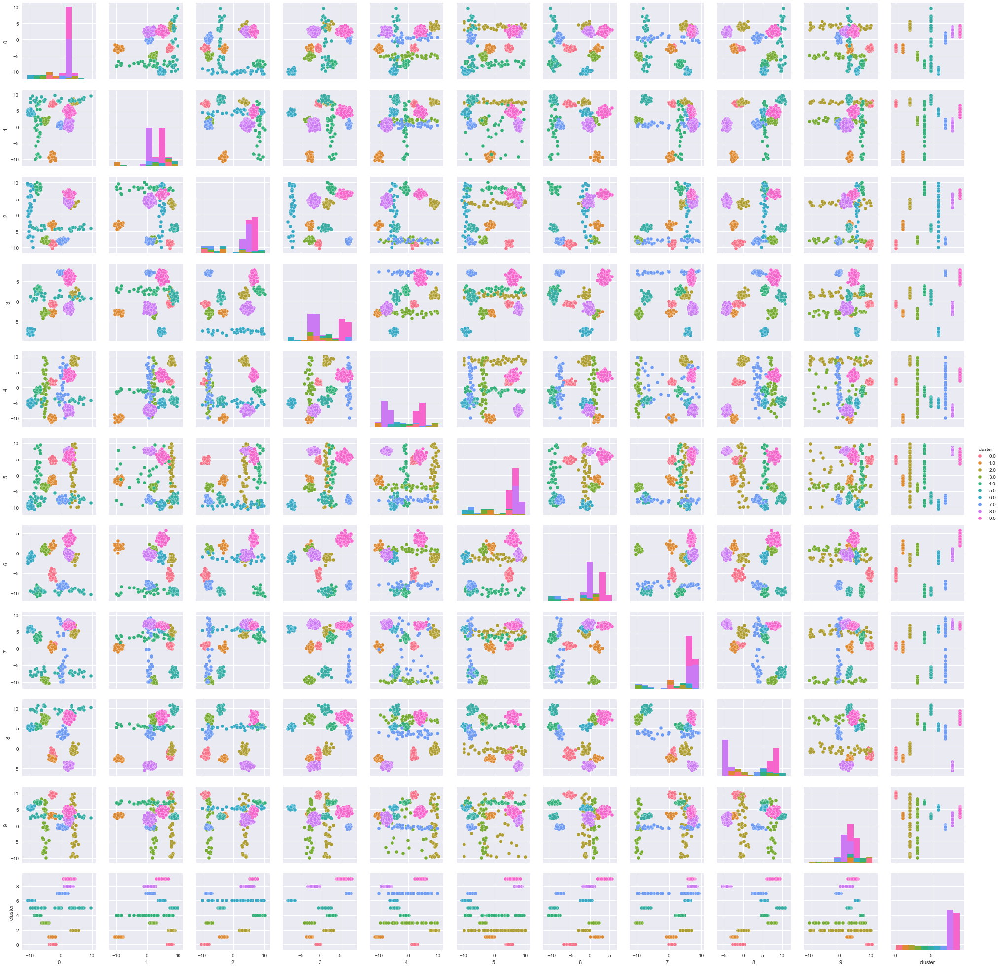

In [48]:
sns.pairplot(data=stream_df,hue="cluster")

# Apply Drift

In [49]:
from Changes import apply_drift

In [54]:
apply_drift(sg.clusters, {9:{8:-10}}, -20, 20)

In [55]:
stream_ss,stream_df = sg.get_full_dataset(1001)

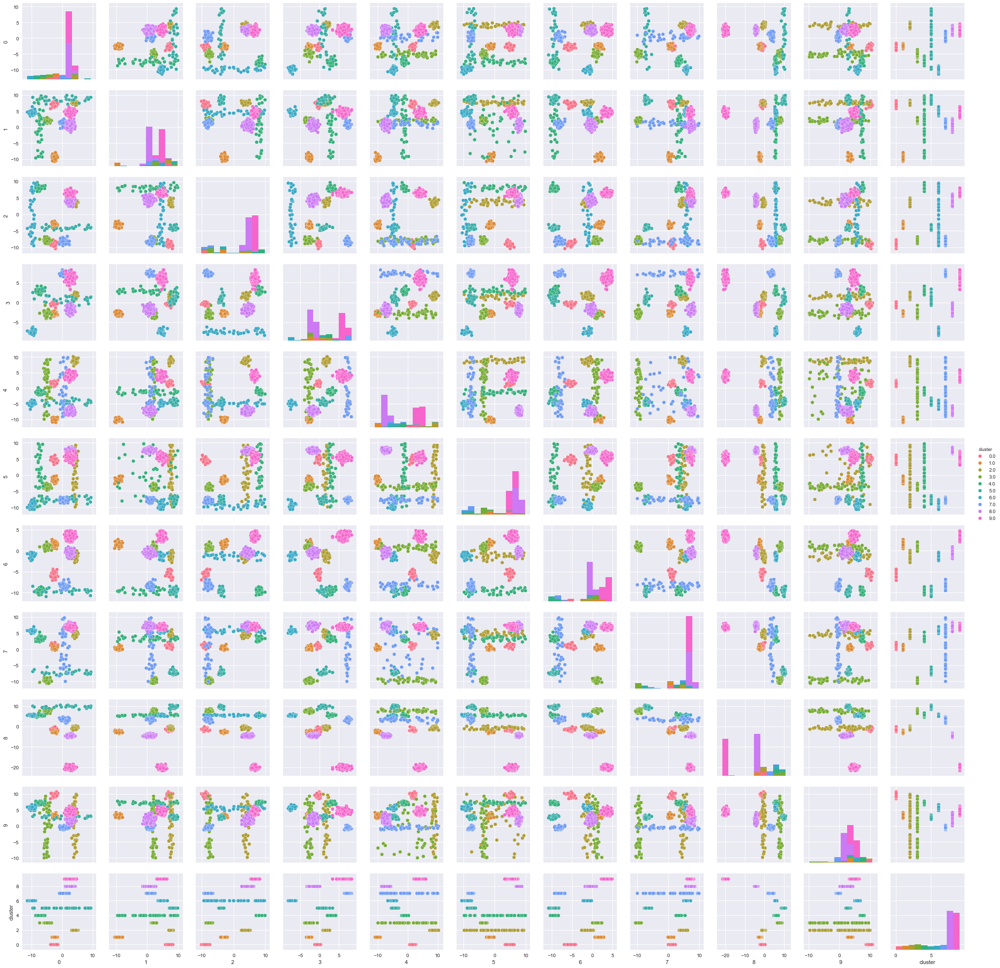

In [56]:
sns.pairplot(data=stream_df,hue="cluster")

# Change Density

In [62]:
def apply_density_change(clusters, cluster_feature_std):
	for cluster_id, feature_std in cluster_feature_std.iteritems():
		for feature, std in feature_std.iteritems():
			clusters[cluster_id].radii[feature] = std

In [63]:
apply_density_change(sg.clusters, {i:{9:1} for i in range(10)})

In [64]:
stream_ss,stream_df = sg.get_full_dataset(1001)

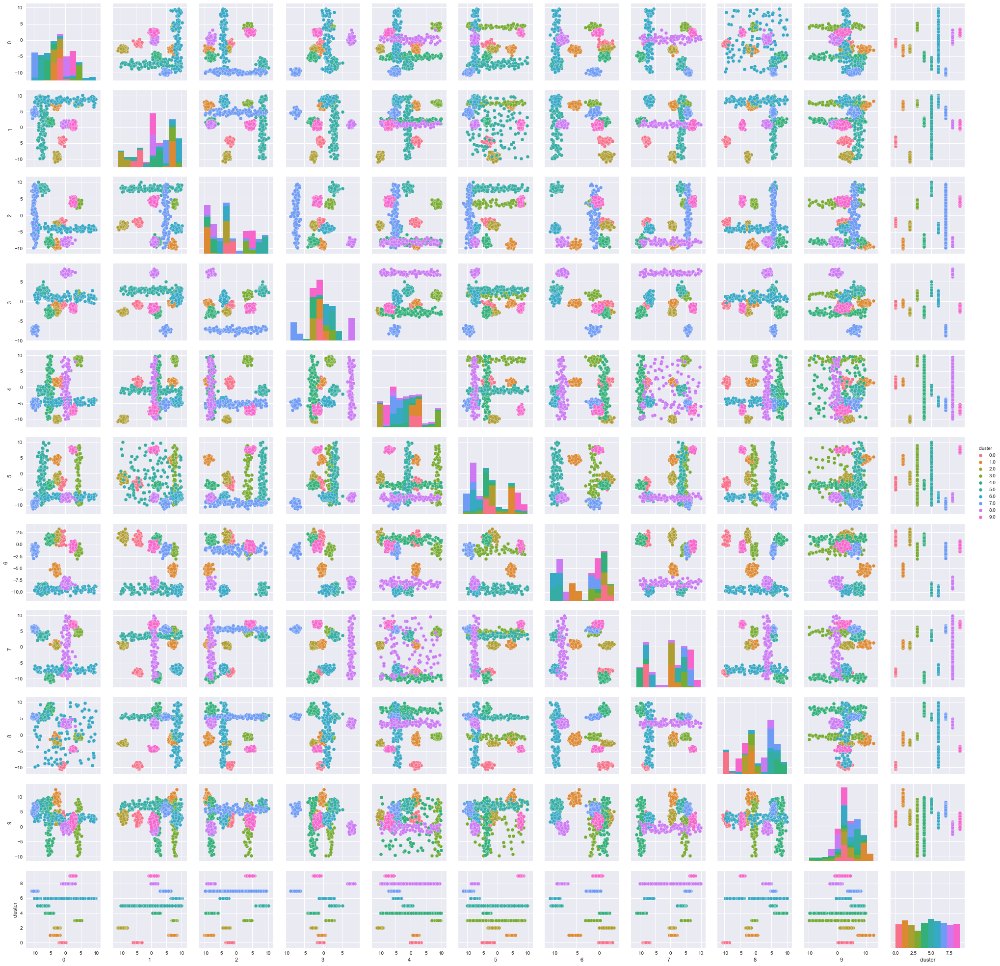

In [65]:
sns.pairplot(data=stream_df,hue="cluster")